In [3]:
from wavediffusion.model_unet import myUnet
from wavediffusion.model import Scaled
from wavediffusion.wavedata import npyDataResized, npyDataWndHist, npyDataWndHistDaily
from torch.utils.data import DataLoader
from torch_ema import ExponentialMovingAverage as EMA
from wavediffusion.diffusion import ScheduleLogLinear, ScheduleDDPM, samples, samples_thres
from accelerate import Accelerator
import torch
import numpy as np
import os
from torchvision import transforms as tf
from matplotlib import pyplot as plt
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


#### Without history

In [3]:
train_file_path = '/global/homes/j/jiarongw/scratch_folder/wave_data/train_global/'
test_file_path = '/global/homes/j/jiarongw/scratch_folder/wave_data/test_global/'
test_file_names = [('wave_200804', 'forcing_200804')]
stats_file = os.path.join(train_file_path, 'stats.npz')
stats = np.load(stats_file)
meanx, stdx = stats['meanx'], stats['stdx']
meanf, stdf = stats['meanf'], stats['stdf']

### Construct test dataset
test_file_list = [(os.path.join(test_file_path, f'{x}.npy'), 
                   os.path.join(test_file_path, f'{f}.npy')) for x, f in test_file_names]
test = npyDataResized(
    test_file_list,
    resize_x=(320,320), resize_f=(320,320), 
    landmaskname=os.path.join(test_file_path, 'mask.npy'),
    use_icymask=True,
    compute_stats=False,
    meanx=meanx, stdx=stdx, meanf=meanf, stdf=stdf
)

In [4]:
epoch = 16
path = '/global/homes/j/jiarongw/scratch_folder/log1p/DDPM3/'
weights_file = path + f'ckpt_{epoch}.pt'

RESUME = True
GUIDED = True

# model = Scaled(myUnet)(in_dim=320, in_ch=4, out_ch=4, ch=192, precond_ch=3, 
#                        scale=(torch.tensor([0.,0.,0.,0.]), torch.tensor([0.,0.,0.,0.]),
#                               torch.tensor([0.,0.,0.,]), torch.tensor([0.,0.,0.,])),
#                        ch_mult=(1, 2, 2), attn_resolutions=(16,))

model = Scaled(myUnet)(in_dim=320, in_ch=4, out_ch=4, ch=192, precond_ch=3, 
                       scale=(torch.tensor([0.,0.,0.,0.]), torch.tensor([0.,0.,0.,0.]),
                              torch.tensor([0.,0.,0.,]), torch.tensor([0.,0.,0.,])),
                       ch_mult=(1, 2, 2), attn_resolutions=(16,))

#### With history

In [44]:
train_file_path = '/global/homes/j/jiarongw/scratch_folder/wave_data/train_global/'
test_file_path = '/global/homes/j/jiarongw/scratch_folder/wave_data/test_global/'
test_file_names = [('wave_200804', 'forcing_200804')]
stats_file = os.path.join(train_file_path, 'stats.npz')
stats = np.load(stats_file)
meanx, stdx = stats['meanx'], stats['stdx']
meanf, stdf = stats['meanf'], stats['stdf']

test_file_path = '/global/homes/j/jiarongw/scratch_folder/wave_data/test_global/'
test_file_names = [('wave_200804', 'forcing_200804')]
test_file_list = [(os.path.join(test_file_path, f'{x}.npy'), 
                   os.path.join(test_file_path, f'{f}.npy')) for x, f in test_file_names]
test = npyDataWndHist(
    test_file_list,
    resize_x=(320,320), resize_f=(320,320), 
    landmaskname=os.path.join(test_file_path, 'mask.npy'),
    use_icymask=True, compute_stats=False,
    meanx=meanx, stdx=stdx, meanf=meanf, stdf=stdf
)

In [45]:
RESUME = True
GUIDED = False
epoch = 12
path = '/global/homes/j/jiarongw/scratch_folder/log1p/hist1/'
weights_file = path + f'ckpt_{epoch}.pt'

model = Scaled(myUnet)(in_dim=320, in_ch=4, out_ch=4, ch=256, precond_ch=13, 
                       scale=(test.meanx, test.stdx, test.meanf, test.stdf),
                       ch_mult=(1, 2, 2), attn_resolutions=(16,))  

#### Load 

In [56]:
ema = EMA(model.parameters(), decay=0.999)
    
if RESUME:
    ckpt = torch.load(weights_file, map_location="cpu")
    model.load_state_dict(ckpt["model"])
    ema.load_state_dict(ckpt["ema"])

loader_test = DataLoader(test, batch_size=1, shuffle=False)
a = Accelerator()
model, loader_test = a.prepare(model, loader_test)
ema.to(a.device)

schedule_infer = ScheduleLogLinear(sigma_min=0.01, sigma_max=20, N=100)
# schedule_infer = ScheduleDDPM(N=700)

In [11]:
pytorch_total_params = sum(p.numel() for p in model.parameters())
print(f"Total Parameters: {pytorch_total_params}")
pytorch_trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total Trainable Parameters: {pytorch_trainable_params}")

Total Parameters: 98054404
Total Trainable Parameters: 98054404


### Generate

In [57]:
n_ensem = 5

loader_iter = iter(loader_test) 
x, f, mask = test.__getitem__(20)
x = x.unsqueeze(0); f = f.unsqueeze(0); mask = mask.unsqueeze(0)

x0_ensem = []
# TODO: make this batched (by stacking f)
with ema.average_parameters():
    for i in range(0, n_ensem):
        print(f'Generate sample {i} ...')
        if GUIDED:
            hs_thres = -test.meanx[0]/test.stdx[0]
            *xt, x0 = samples_thres(model, schedule_infer.sample_sigmas(100), gam=1, mu=0.5, batchsize=1, 
                                    thres=hs_thres, accelerator=a, cond=f, mask=mask)
        else:
            *xt, x0 = samples(model, schedule_infer.sample_sigmas(100), gam=1, mu=0.5, batchsize=1,
                              accelerator=a, cond=f, mask=mask)
        x_ = test.invert_x(x0[0])
        x_ = x_ * tf.Resize((320,720))(mask[0].to(x_))
        x0_ensem.append(x_.cpu().numpy())

x_truth = test.invert_x(x[0]) * tf.Resize((320,720))(mask[0].to(x))
x_truth = x_truth.cpu().numpy()
f_ = test.invert_f(f[0]).cpu().numpy()
x0_ensem = np.array(x0_ensem)

mean = x0_ensem.mean(axis=0)
std = x0_ensem.std(axis=0)

Generate sample 0 ...
Generate sample 1 ...
Generate sample 2 ...
Generate sample 3 ...
Generate sample 4 ...


### Plot individual samples

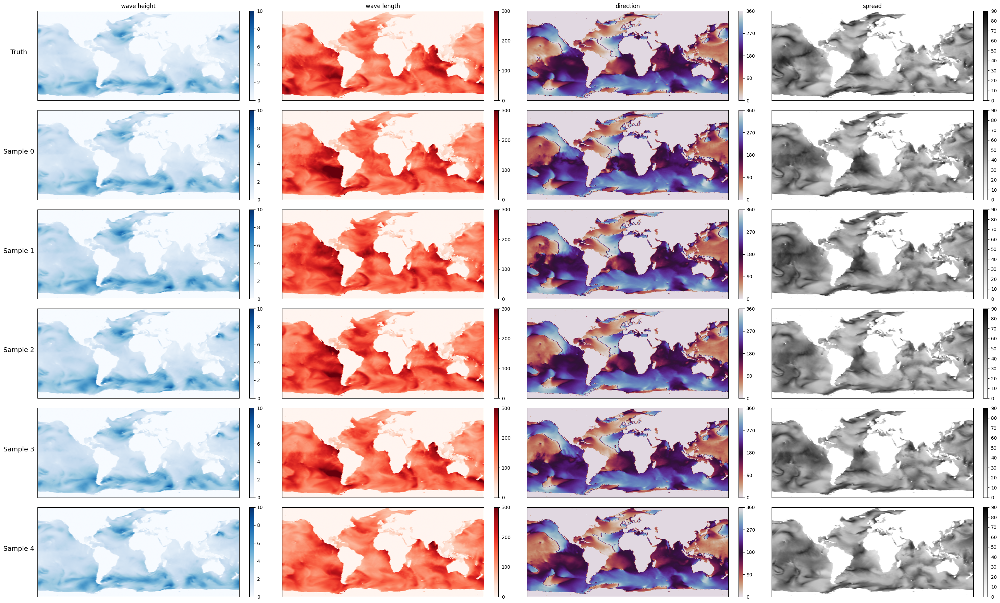

In [53]:
from wavediffusion.waveutils import plot_sample
fig = plot_sample(x_truth[:,::-1], x0_ensem[:5,:,::-1], f_[:,::-1])

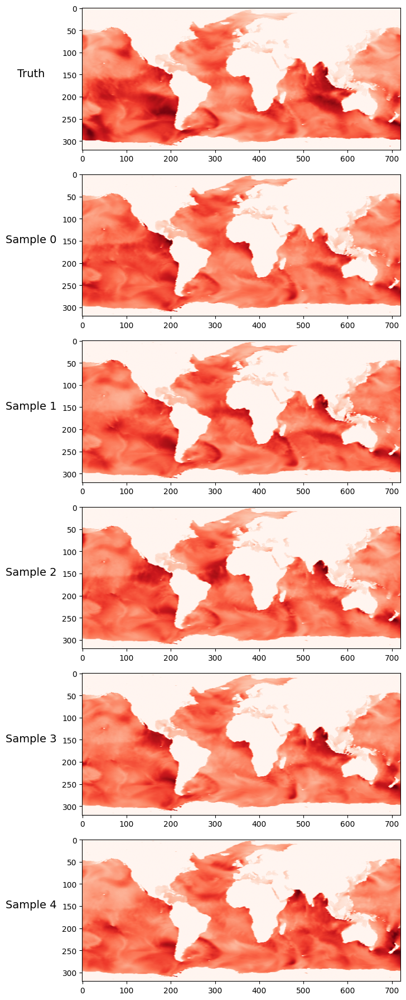

In [63]:
from wavediffusion.waveutils import plot_sample
fig = plot_sample(x_truth[[1],::-1], x0_ensem[:5,[1],::-1], f_[:,::-1], VAR='lp')

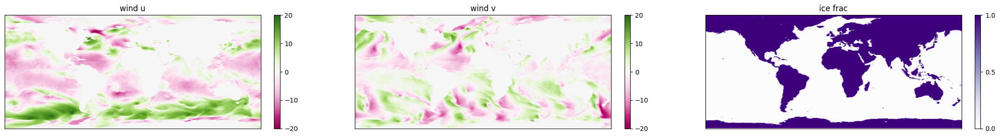

In [14]:
from waveutils import plot_forcing
fig = plot_forcing(f_[:,::-1])

/tmp/ipykernel_1269452/916911825.py:4: RuntimeWarning: invalid value encountered in divide
  plt.imshow(c[::-1]/u[::-1], vmax=5, vmin=0.8, cmap='Blues')


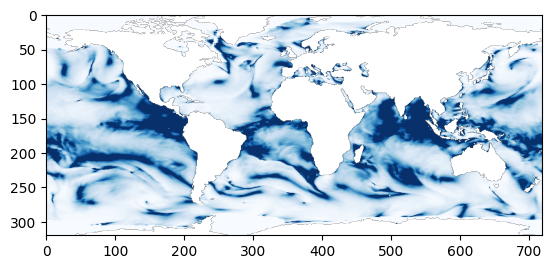

In [112]:
from waveutils import plot_sample
c = (9.8*x_truth[1]/2/np.pi)**0.5
u = (f_[0] ** 2 + f_[1] ** 2)**0.5
plt.imshow(c[::-1]/u[::-1], vmax=5, vmin=0.8, cmap='Blues')

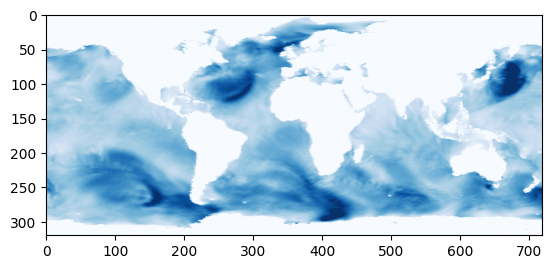

In [139]:
plt.imshow(std[0,::-1], vmax=1, vmin=0, cmap='Blues')

/tmp/ipykernel_1269452/896684695.py:1: RuntimeWarning: invalid value encountered in divide
  plt.imshow(std[1,::-1]/mean[1,::-1], vmax=0.5, vmin=0, cmap='Blues')


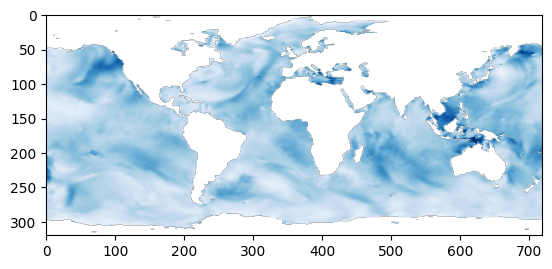

In [129]:
plt.imshow(std[1,::-1]/mean[1,::-1], vmax=0.5, vmin=0, cmap='Blues')

/tmp/ipykernel_1269452/3766158363.py:1: RuntimeWarning: invalid value encountered in divide
  plt.imshow((mean[1,::-1]-x_truth[1,::-1])/x_truth[1,::-1], vmax=0.5, vmin=0, cmap='Blues')


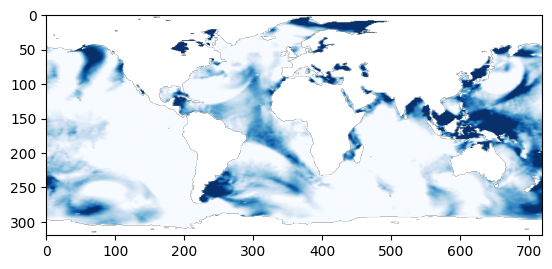

In [132]:
plt.imshow((mean[1,::-1]-x_truth[1,::-1])/x_truth[1,::-1], vmax=0.5, vmin=0, cmap='Blues')

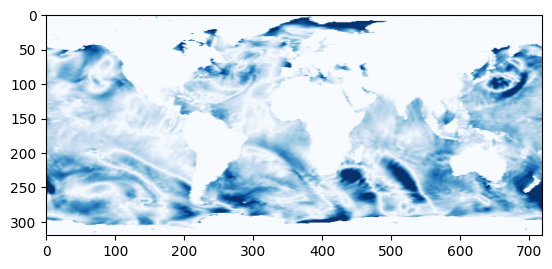

In [140]:
plt.imshow(abs(mean[0,::-1]-x_truth[0,::-1]), vmax=1, vmin=0, cmap='Blues')

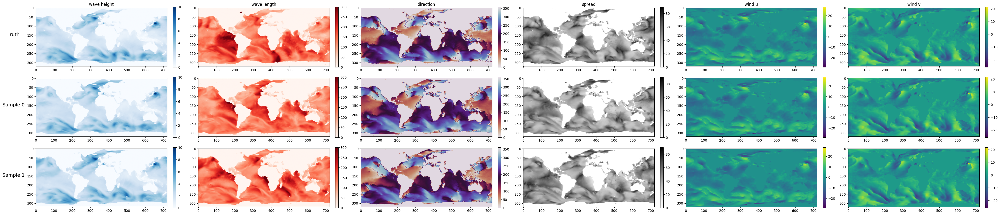

In [62]:
from waveutils import plot_sample
fig = plot_sample(x_truth[:,::-1], x0_ensem[:2,:,::-1], f_[:,::-1])

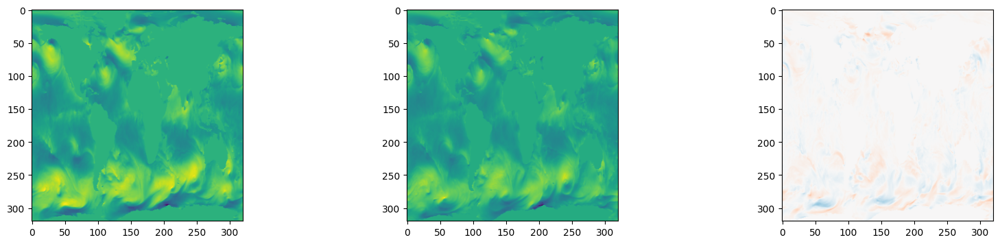

In [23]:
fig, axes = plt.subplots(1, 3, figsize=(20, 4))
axes[0].imshow(f[0,0].cpu().numpy()[::-1])
axes[1].imshow(f[0,3].cpu().numpy()[::-1])
axes[2].imshow(f[0,3].cpu().numpy()[::-1] - f[0,0].cpu().numpy()[::-1], vmax=10, vmin=-10, cmap='RdBu_r')

### Plot mean and variance

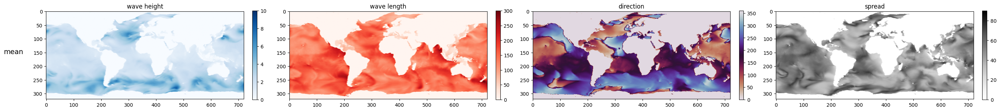

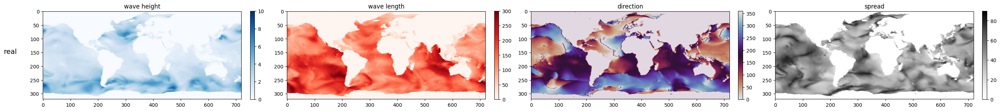

In [58]:
from wavediffusion.waveutils import plot_wave
fig = plot_wave(mean[:,::-1], label='mean')
fig = plot_wave(x_truth[:,::-1], label='real')

In [60]:
hs_err = np.average((x_truth[0,::-1] - mean[0,::-1]) ** 2) ** 0.5
print(f'hs error: {hs_err:.2f}')
lp_err = np.average((x_truth[1,::-1] - mean[1,::-1]) ** 2) ** 0.5
print(f'lp error: {lp_err:.2f}')
thetap_err = np.average((x_truth[2,::-1] - mean[2,::-1]) ** 2) ** 0.5
print(f'thetap error: {thetap_err:.2f}')

hs error: 0.24
lp error: 20.87
thetap error: 26.14


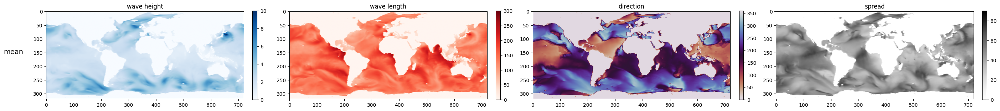

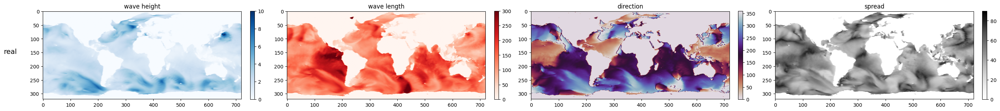

In [63]:
from waveutils import plot_wave
fig = plot_wave(mean[:,::-1], label='mean')
fig = plot_wave(x_truth[:,::-1], label='real')

tensor(0.6276)


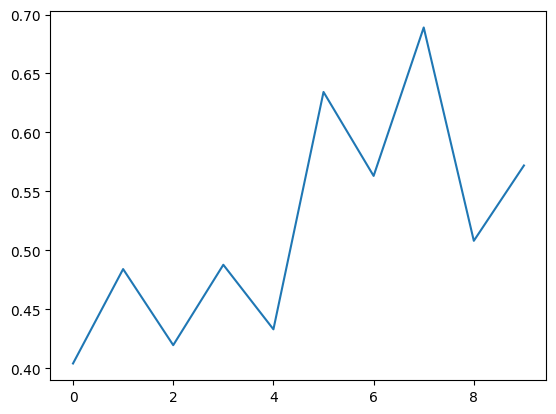

In [93]:
f = 0
rmse = np.zeros(10)
for i in range(0,10):
    rmse[i] = (np.sum((x0_ensem[i,f] - mean[f])**2) / torch.sum(mask))**0.5
plt.plot(rmse)
print((np.sum((x_truth[f] - mean[f])**2) / torch.sum(mask))**0.5)

tensor(1.1636)


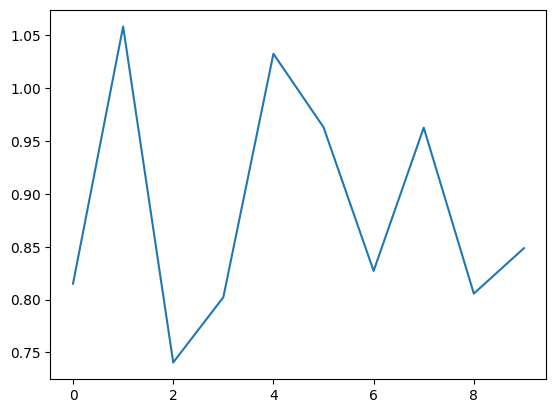

In [94]:
f = 1
a0 = (1*np.pi/9.8) ** 0.5
rmse = np.zeros(10)
for i in range(0,10):
    rmse[i] = (np.sum((a0*(abs(x0_ensem[i,f]))**0.5 - a0*(abs(mean[f]))**0.5)**2) / torch.sum(mask))**0.5
plt.plot(rmse)
print((np.sum((a0*(abs(x_truth[f]))**0.5 - a0*(abs(mean[f]))**0.5)**2) / torch.sum(mask))**0.5)

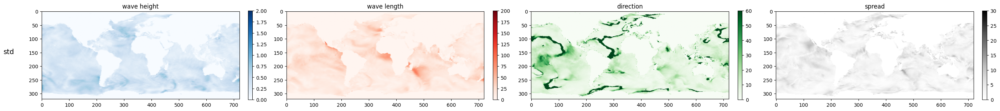

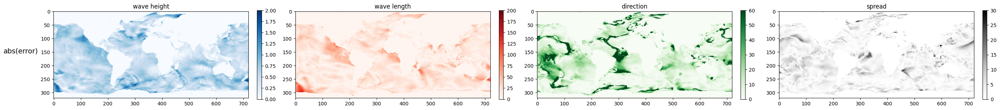

In [13]:
from matplotlib import pyplot as plt
def plot_var(x, label='None'):
    n_sample = x.shape[0]
    fig, axes = plt.subplots(1, 4, figsize=[30, 3], dpi=100)
    titles = ['wave height','wave length','direction','spread']
    imgs = [
        axes[0].imshow(x[0], vmin=0, vmax=2, cmap='Blues'),
        axes[1].imshow(x[1], vmin=0, vmax=200, cmap='Reds'),
        axes[2].imshow(x[2], vmin=0, vmax=60, cmap='Greens'),
        axes[3].imshow(x[3], vmin=0, vmax=30, cmap='Grays'),
    ]
    axes[0].set_ylabel(label, fontsize=14, rotation=0, labelpad=40)
    for j in range(4):
        axes[j].set_title(titles[j])
        fig.colorbar(imgs[j], ax=axes[j], fraction=0.046, pad=0.04)
        
    plt.tight_layout(rect=[0.06, 0, 1, 1])  # leave room on the left for text
    return fig


fig1 = plot_var(std[:,::-1], label='std')
fig2 = plot_var(abs(x_truth[:,::-1] - mean[:,::-1]), label='abs(error)')

### Plot distribution

(5, 320, 720)
(5, 320, 720)
(5, 320, 720)
(5, 320, 720)
(320, 720)
(320, 720)
(320, 720)
(320, 720)


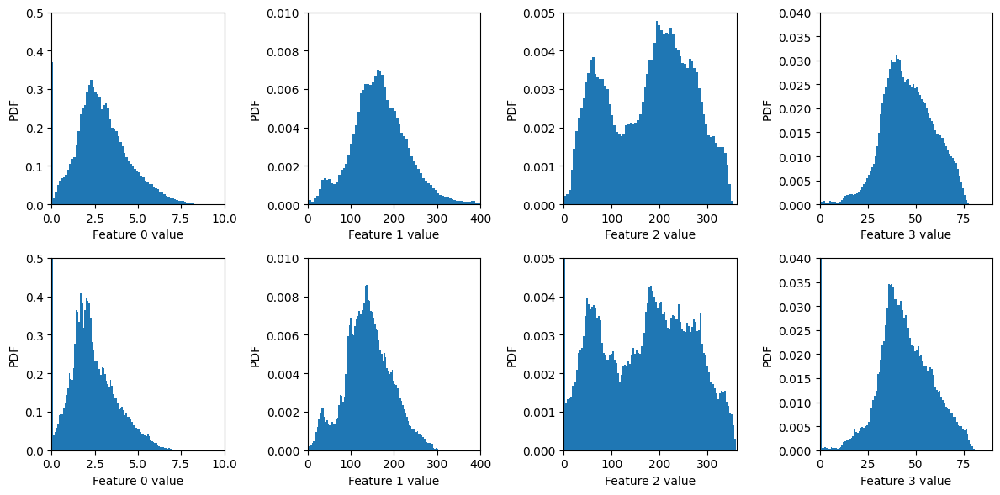

In [8]:
mask_bool = tf.Resize((320,720))(mask[0].to(x)).bool()[0]  # (H, W)

from matplotlib import pyplot as plt

fig, axes = plt.subplots(2, 4, figsize=[12,6], dpi=100)
for i in range(0,4):
    feat_vals = x0_ensem[:, i]         # (B, H, W)
    print(feat_vals.shape)
    selected = feat_vals[:, mask_bool] # (B, Nmasked)
    selected = selected.reshape(-1)    # (B * Nmasked,)
    axes[0,i].hist(selected, bins=100, density=True)
    axes[0,i].set_xlabel(f"Feature {i} value")
    axes[0,i].set_ylabel("PDF")
    # axes[0,i].set_xlim([-3,3])

for i in range(0,4):
    feat_vals = x_truth[i]            # (H, W)
    print(feat_vals.shape)
    selected = feat_vals[mask_bool]
    axes[1,i].hist(selected, bins=100, density=True)
    axes[1,i].set_xlabel(f"Feature {i} value")
    axes[1,i].set_ylabel("PDF")
    # axes[1,i].set_xlim([-3,3])

axes[0,0].set_xlim([0,10]); axes[1,0].set_xlim([0,10])
axes[0,0].set_ylim([0,0.5]); axes[1,0].set_ylim([0,0.5])
axes[0,1].set_xlim([0,400]); axes[1,1].set_xlim([0,400])
axes[0,1].set_ylim([0,0.01]); axes[1,1].set_ylim([0,0.01])
axes[0,2].set_xlim([0,360]); axes[1,2].set_xlim([0,360])
axes[0,2].set_ylim([0,0.005]); axes[1,2].set_ylim([0,0.005])
axes[0,3].set_xlim([0,90]); axes[1,3].set_xlim([0,90])
axes[0,3].set_ylim([0,0.04]); axes[1,3].set_ylim([0,0.04])
plt.tight_layout()

In [ ]:
# If i compare the distribution of any generated field with the truth, it's ok.
# If i compare ensemble, distribution looks smoothed.
# But it seems that there are some extreme values for wave height
# print(x0_ensem[:,0].max()) gives about 340